# 📚 Comics Zero-Shot Baseline with Scene Predictions

This notebook handles **everything** in one place:

1. **Part A**: Create the inference script (runs on GPU)
2. **Part B**: Create the SLURM batch file (submits the job)
3. **Part C**: Submit the job and monitor progress
4. **Part D**: Re-parse and visualize results

---

**You run this notebook from the Delta LOGIN node (no GPU needed).**

The actual inference runs as a batch job on the GPU node.

---
# PART A: Create the Inference Script
---

This cell creates the Python script that will run on the GPU node.

**You only need to run this once** (or when you want to change the script).

In [3]:
# =============================================================================
# CONFIGURATION - EDIT THESE IF NEEDED
# =============================================================================

PROJECT_DIR = "/scratch/bftl/hsekar/comics_project"
CONDA_ENV_PATH = "/u/hsekar/comics_env"
NUM_EXAMPLES = 1000  # Number of examples to evaluate

# =============================================================================
# CREATE DIRECTORIES
# =============================================================================

import os
from pathlib import Path

project_path = Path(PROJECT_DIR)
scripts_dir = project_path / "scripts"
logs_dir = project_path / "logs"
outputs_dir = project_path / "outputs" / "zero_shot_pred"

scripts_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)
outputs_dir.mkdir(parents=True, exist_ok=True)

print("✅ Directories created:")
print(f"   Scripts: {scripts_dir}")
print(f"   Logs: {logs_dir}")
print(f"   Outputs: {outputs_dir}")

✅ Directories created:
   Scripts: /scratch/bftl/hsekar/comics_project/scripts
   Logs: /scratch/bftl/hsekar/comics_project/logs
   Outputs: /scratch/bftl/hsekar/comics_project/outputs/zero_shot_pred


In [11]:
# =============================================================================
# CREATE THE INFERENCE SCRIPT
# =============================================================================
# This script uses a SIMPLE prompt and saves the raw free-form output.
# No complex structured output - just let the model describe what happens next.
# =============================================================================

script_content = f'''\
#!/usr/bin/env python3
"""
COMICS MULTIMODAL CLOZE - ZERO-SHOT BASELINE (PRED)
=============================================
Simple approach: Ask model to predict next panel, save free-form output.

Author: Harsha Sekar
Date: December 2025
"""

import os
import json
import pickle
import random
import time
from datetime import datetime
from pathlib import Path
from typing import List, Dict

from PIL import Image
from tqdm import tqdm
import torch

from transformers import (
    LlavaOnevisionProcessor,
    LlavaOnevisionForConditionalGeneration,
)

# =============================================================================
# CONFIGURATION
# =============================================================================

PROJECT_DIR = Path("{PROJECT_DIR}")
DATA_DIR = PROJECT_DIR / "data"
PROCESSED_DIR = DATA_DIR / "processed"
OUTPUT_DIR = PROJECT_DIR / "outputs" / "zero_shot_pred"
MODEL_CACHE = PROJECT_DIR / "model_cache"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MODEL_ID = "llava-hf/llava-onevision-qwen2-7b-ov-hf"
NUM_EXAMPLES = {NUM_EXAMPLES}
CONTEXT_PANELS = 5
RANDOM_SEED = 42
MAX_IMAGE_SIZE = 672

GENERATION_CONFIG = {{
    "max_new_tokens": 800,
    "temperature": 0.3,
    "do_sample": True,
    "top_p": 0.9,
    "repetition_penalty": 1.1,
}}


# =============================================================================
# SIMPLE PROMPT - Just ask what happens next
# =============================================================================

def create_prompt(context_texts: List[str]) -> str:
    """Simple prompt asking model to predict the next panel."""
    
    prompt = """You are looking at 5 consecutive panels from a comic book.

Here is the text from each panel:
"""
    
    for i, text in enumerate(context_texts, 1):
        if text and text.strip():
            prompt += f"Panel {{i}}: {{text.strip()[:400]}}\\n"
        else:
            prompt += f"Panel {{i}}: [No text]\\n"
    
    prompt += """
Based on what you see in these 5 panels, describe what you think happens in the NEXT panel (Panel 6).

Include:
- What the scene looks like
- What the characters are doing
- Any dialogue they might say
- Any sound effects

Describe Panel 6:
"""
    return prompt


# =============================================================================
# IMAGE LOADING
# =============================================================================

def load_context_images(sequence: Dict, num_context: int = 5, max_size: int = 672) -> List[Image.Image]:
    """Load context panel images (NOT the target panel)."""
    images = []
    context_panels = sequence["context"][-num_context:]
    
    for panel in context_panels:
        img_path = Path(panel["image_path"])
        if img_path.exists():
            img = Image.open(img_path).convert("RGB")
            if max(img.size) > max_size:
                ratio = max_size / max(img.size)
                new_size = (int(img.size[0] * ratio), int(img.size[1] * ratio))
                img = img.resize(new_size, Image.LANCZOS)
            images.append(img)
        else:
            images.append(Image.new("RGB", (336, 336), color="gray"))
    
    return images


# =============================================================================
# INFERENCE
# =============================================================================

def run_inference(sequence: Dict, model, processor, gen_config: Dict) -> str:
    """Run inference and return raw model output."""
    
    images = load_context_images(sequence, num_context=CONTEXT_PANELS, max_size=MAX_IMAGE_SIZE)
    
    context_texts = sequence.get("context_texts", [])
    context_texts = context_texts[-CONTEXT_PANELS:] if len(context_texts) > CONTEXT_PANELS else context_texts
    while len(context_texts) < CONTEXT_PANELS:
        context_texts.insert(0, "")
    
    text_prompt = create_prompt(context_texts)
    image_placeholders = "\\n".join(["<image>" for _ in images])
    
    conversation = [{{
        "role": "user",
        "content": [{{"type": "text", "text": image_placeholders + "\\n\\n" + text_prompt}}]
    }}]
    
    prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
    
    inputs = processor(
        images=images,
        text=prompt,
        return_tensors="pt",
        padding=True
    ).to(model.device)
    
    with torch.inference_mode():
        output_ids = model.generate(**inputs, **gen_config)
    
    input_len = inputs["input_ids"].shape[1]
    generated_ids = output_ids[0, input_len:]
    raw_output = processor.decode(generated_ids, skip_special_tokens=True)
    
    del inputs, output_ids
    torch.cuda.empty_cache()
    
    return raw_output


# =============================================================================
# MAIN
# =============================================================================

def main():
    print("="*70)
    print("COMICS ZERO-SHOT BASELINE (PRED)")
    print("="*70)
    
    # GPU check
    print(f"\\nPyTorch: {{torch.__version__}}")
    print(f"CUDA available: {{torch.cuda.is_available()}}")
    if torch.cuda.is_available():
        print(f"GPU: {{torch.cuda.get_device_name(0)}}")
        print(f"GPU Memory: {{torch.cuda.get_device_properties(0).total_memory / 1e9:.1f}} GB")
    else:
        print("NO GPU! Exiting.")
        return
    
    # Load data
    print("\\nLoading data...")
    sequences_path = PROCESSED_DIR / "test_sequences_with_predictions.pkl"
    with open(sequences_path, "rb") as f:
        all_sequences = pickle.load(f)
    print(f"Loaded {{len(all_sequences):,}} sequences")
    
    random.seed(RANDOM_SEED)
    sequences = random.sample(all_sequences, min(NUM_EXAMPLES, len(all_sequences)))
    print(f"Selected {{len(sequences)}} for evaluation")
    
    # Load model
    print("\\nLoading model...")
    start = time.time()
    
    processor = LlavaOnevisionProcessor.from_pretrained(MODEL_ID, cache_dir=MODEL_CACHE)
    model = LlavaOnevisionForConditionalGeneration.from_pretrained(
        MODEL_ID,
        torch_dtype=torch.float16,
        device_map="auto",
        cache_dir=MODEL_CACHE
    )
    
    print(f"Model loaded in {{time.time()-start:.1f}}s")
    print(f"GPU memory used: {{torch.cuda.memory_allocated()/1e9:.1f}} GB")
    
    # Run evaluation
    print(f"\\nRunning evaluation on {{len(sequences)}} examples...")
    results = []
    start_total = time.time()
    
    for i, seq in enumerate(tqdm(sequences, desc="Evaluating")):
        try:
            start = time.time()
            raw_output = run_inference(seq, model, processor, GENERATION_CONFIG)
            elapsed = time.time() - start
            
            # Clean up output (remove trailing "None" lines)
            if raw_output:
                lines = raw_output.strip().split("\\n")
                cleaned_lines = [l for l in lines if l.strip().lower() != "none"]
                scene_prediction = "\\n".join(cleaned_lines).strip()
            else:
                scene_prediction = ""
            
            # Store context image paths for visualization
            context_panels = seq["context"][-CONTEXT_PANELS:]
            
            results.append({{
                "id": i + 1,
                "comic_no": int(seq["comic_no"]),
                "story_idx": seq.get("story_idx"),
                
                # Context info
                "context_image_paths": [str(p["image_path"]) for p in context_panels],
                "context_texts": seq.get("context_texts", [])[-CONTEXT_PANELS:],
                
                # Target info
                "target_image_path": str(seq["target"]["image_path"]),
                "target_page_no": seq["target"].get("page_no"),
                "target_panel_no": seq["target"].get("panel_no"),
                
                # Ground truth
                "ground_truth": seq.get("scene_prediction", ""),
                
                # Prediction (simple: just the scene description)
                "scene_prediction": scene_prediction,
                "predicted_text": scene_prediction,  # Same thing for metrics
                "raw_output": raw_output,
                
                "inference_time": elapsed,
                "status": "success"
            }})
            
        except Exception as e:
            print(f"Error on {{i+1}}: {{e}}")
            results.append({{
                "id": i + 1,
                "comic_no": int(seq["comic_no"]),
                "status": "failed",
                "error": str(e)
            }})
    
    total_time = time.time() - start_total
    
    # Summary
    successful = [r for r in results if r["status"] == "success"]
    failed = [r for r in results if r["status"] == "failed"]
    has_scene = [r for r in successful if r.get("scene_prediction")]
    
    print(f"\\n" + "="*70)
    print("RESULTS")
    print("="*70)
    print(f"Total time: {{total_time:.1f}}s ({{total_time/len(sequences):.2f}}s per example)")
    print(f"Successful: {{len(successful)}}/{{len(sequences)}}")
    print(f"Scene descriptions: {{len(has_scene)}}/{{len(successful)}} ({{100*len(has_scene)/len(successful):.1f}}%)")
    
    # Save results
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    
    output_data = {{
        "metadata": {{
            "model": MODEL_ID,
            "task": "zero_shot_cloze",
            "approach": "free-form scene description",
            "num_examples": len(sequences),
            "successful": len(successful),
            "failed": len(failed),
            "scenes_extracted": len(has_scene),
            "total_time_seconds": total_time,
            "timestamp": datetime.now().isoformat(),
        }},
        "results": results
    }}
    
    # Save as latest (for easy access)
    latest_pkl = OUTPUT_DIR / "results_latest.pkl"
    with open(latest_pkl, "wb") as f:
        pickle.dump(output_data, f)
    print(f"\\n✅ Saved: {{latest_pkl}}")
    
    # Save timestamped version
    timestamped_pkl = OUTPUT_DIR / f"results_{{timestamp}}.pkl"
    with open(timestamped_pkl, "wb") as f:
        pickle.dump(output_data, f)
    print(f"✅ Saved: {{timestamped_pkl}}")
    
    # Save JSON
    json_file = OUTPUT_DIR / f"results_{{timestamp}}.json"
    with open(json_file, "w") as f:
        json.dump(output_data, f, indent=2, default=str)
    print(f"✅ Saved: {{json_file}}")
    
    print(f"\\n" + "="*70)
    print("DONE!")
    print("="*70)


if __name__ == "__main__":
    main()
'''

# Save the script
script_path = scripts_dir / "zero_shot_pred.py"
with open(script_path, 'w') as f:
    f.write(script_content)

print(f"✅ Script saved to: {script_path}")
print(f"\n   This script will evaluate {NUM_EXAMPLES} examples.")
print(f"   Output: Free-form scene descriptions (simple approach)")

✅ Script saved to: /scratch/bftl/hsekar/comics_project/scripts/zero_shot_pred.py

   This script will evaluate 1000 examples.
   Output: Free-form scene descriptions (simple approach)


---
# PART B: Create the SLURM Batch File
---

This creates the file that submits the job to the GPU cluster.

**Uses `gpuH200x8` partition**

In [13]:
# =============================================================================
# CREATE SLURM BATCH FILE (H200x8 - no exclusions)
# =============================================================================

sbatch_content = f'''#!/bin/bash
#SBATCH --job-name=comics_zero_pred
#SBATCH --account=bftl-delta-gpu
#SBATCH --partition=gpuH200x8
#SBATCH --nodes=1
#SBATCH --gpus-per-node=1
#SBATCH --cpus-per-task=16
#SBATCH --mem=120G
#SBATCH --time=04:00:00
#SBATCH --output={logs_dir}/zero_shot_pred_%j.out
#SBATCH --error={logs_dir}/zero_shot_pred_%j.err

echo "==========================================="
echo "COMICS ZERO-SHOT BASELINE (PRED) - H200"
echo "==========================================="
echo "Job ID: $SLURM_JOB_ID"
echo "Node: $SLURMD_NODENAME"
echo "Started: $(date)"
echo "==========================================="

# Load conda
source /sw/external/python/anaconda3/etc/profile.d/conda.sh
conda activate {CONDA_ENV_PATH}

# Show GPU info
echo ""
echo "GPU Info:"
nvidia-smi --query-gpu=name,memory.total --format=csv
echo ""

# Run the script
cd {PROJECT_DIR}
python {scripts_dir}/zero_shot_pred.py

echo ""
echo "==========================================="
echo "Finished: $(date)"
echo "==========================================="
'''

sbatch_path = project_path / "run_zero_shot_pred.sbatch"
with open(sbatch_path, 'w') as f:
    f.write(sbatch_content)

print(f"✅ Batch file saved to: {sbatch_path}")
print(f"\n   Partition: gpuH200x8 (143GB GPUs)")
print(f"   Time limit: 2 hours")
print(f"   Logs: {logs_dir}")

✅ Batch file saved to: /scratch/bftl/hsekar/comics_project/run_zero_shot_pred.sbatch

   Partition: gpuH200x8 (143GB GPUs)
   Time limit: 2 hours
   Logs: /scratch/bftl/hsekar/comics_project/logs


---
# PART C: Submit and Monitor the Job
---

In [14]:
# =============================================================================
# SUBMIT THE JOB
# =============================================================================

import subprocess

print("Submitting job to SLURM...")
print(f"Command: sbatch {sbatch_path}")
print()

result = subprocess.run(
    ['sbatch', str(sbatch_path)],
    capture_output=True,
    text=True
)

print(result.stdout)
if result.stderr:
    print(f"Errors: {result.stderr}")

if 'Submitted batch job' in result.stdout:
    job_id = result.stdout.strip().split()[-1]
    print(f"\n✅ Job submitted! Job ID: {job_id}")
    print(f"\n📋 Next: Run the cells below to monitor progress.")
else:
    print("\n❌ Job submission may have failed.")

Submitting job to SLURM...
Command: sbatch /scratch/bftl/hsekar/comics_project/run_zero_shot_pred.sbatch

Submitted batch job 14125727


✅ Job submitted! Job ID: 14125727

📋 Next: Run the cells below to monitor progress.


In [20]:
# =============================================================================
# CHECK JOB STATUS
# =============================================================================

import subprocess
import os

print("Your jobs:")
print("="*70)

result = subprocess.run(
    ['squeue', '-u', os.environ.get('USER', 'hsekar')],
    capture_output=True,
    text=True
)
print(result.stdout)

print("\nStatus: PD=Pending, R=Running, CG=Completing")
print("If empty, job finished or failed. Check logs below.")

Your jobs:
       JOBID    PARTITION         NAME           USER ST       TIME  NODES RESERV   NODELIST(REASON) FEATURES
    14125651    gpuH200x8 comics_eval_         hsekar  R      32:34      1    RH9             gpue06 (null)
    14125619    gpuH200x8 comics_eval_         hsekar  R      41:43      1    RH9             gpue03 (null)
    14125727    gpuH200x8 comics_zero_         hsekar  R       0:00      1    RH9             gpue02 (null)


Status: PD=Pending, R=Running, CG=Completing
If empty, job finished or failed. Check logs below.


In [8]:
# =============================================================================
# VIEW LOG OUTPUT
# =============================================================================

from pathlib import Path

logs_dir = Path(f"{PROJECT_DIR}/logs")
log_files = sorted(logs_dir.glob("zero_shot_*.out"), key=lambda x: x.stat().st_mtime, reverse=True)

if log_files:
    latest_log = log_files[0]
    print(f"📄 Log file: {latest_log}")
    print("="*70)
    
    with open(latest_log, 'r') as f:
        lines = f.readlines()
        print(''.join(lines[-60:]))  # Last 60 lines
else:
    print("No log files yet. Job may still be starting.")

📄 Log file: /scratch/bftl/hsekar/comics_project/logs/zero_shot_13957219.out
COMICS ZERO-SHOT BASELINE
Job ID: 13957219
Node: gpuc05
Started: Thu Dec  4 09:23:07 CST 2025

GPU Info:
name, memory.total [MiB]
NVIDIA A100-SXM4-40GB, 40960 MiB




---
# PART D: Visualize Results
---

**Run these cells AFTER the job completes.**

In [4]:
# =============================================================================
# LOAD RESULTS
# =============================================================================

import pickle
from pathlib import Path

results_path = Path(f"{PROJECT_DIR}/outputs/zero_shot_pred/results_latest.pkl")

if not results_path.exists():
    print(f"❌ Results not found: {results_path}")
    print("\n   Job may not have finished. Check status above.")
else:
    with open(results_path, 'rb') as f:
        data = pickle.load(f)
    
    metadata = data['metadata']
    results = data['results']
    
    print("✅ Results loaded!")
    print("="*60)
    print(f"\n📊 SUMMARY:")
    print(f"   Model: {metadata.get('model', 'N/A')}")
    print(f"   Approach: {metadata.get('approach', 'N/A')}")
    print(f"   Total examples: {metadata['num_examples']}")
    print(f"   Successful: {metadata['successful']}")
    print(f"   Scene descriptions: {metadata.get('scenes_extracted', 'N/A')}")
    print(f"   Total time: {metadata.get('total_time_seconds', 0):.1f}s")

✅ Results loaded!

📊 SUMMARY:
   Model: llava-hf/llava-onevision-qwen2-7b-ov-hf
   Approach: free-form scene description
   Total examples: 1000
   Successful: 1000
   Scene descriptions: 1000
   Total time: 3053.4s


In [5]:
# =============================================================================
# FIX EXISTING RESULTS (if needed)
# =============================================================================
# Run this cell if scene_prediction is empty but raw_output has content.
# This uses the raw free-form output as the scene description.
# =============================================================================

import pickle
from pathlib import Path

results_path = Path(f"{PROJECT_DIR}/outputs/zero_shot_pred/results_latest.pkl")

with open(results_path, 'rb') as f:
    data = pickle.load(f)

results = data['results']
fixed_count = 0

for r in results:
    if r['status'] != 'success':
        continue
    
    # If scene_prediction is empty but raw_output has content, use raw_output
    raw = r.get('raw_output', '')
    scene = r.get('scene_prediction', '')
    
    if raw and not scene:
        # Clean up the raw output
        lines = raw.strip().split('\n')
        cleaned = '\n'.join([l for l in lines if l.strip().lower() != 'none'])
        
        if cleaned:
            r['scene_prediction'] = cleaned
            r['predicted_text'] = cleaned
            fixed_count += 1

# Update counts
successful = [r for r in results if r['status'] == 'success']
has_scene = sum(1 for r in successful if r.get('scene_prediction'))
data['metadata']['scenes_extracted'] = has_scene

# Save
with open(results_path, 'wb') as f:
    pickle.dump(data, f)

print(f"✅ Fixed {fixed_count} results")
print(f"   Scene descriptions: {has_scene}/{len(successful)} ({100*has_scene/len(successful):.1f}%)")

✅ Fixed 0 results
   Scene descriptions: 1000/1000 (100.0%)


In [6]:
# =============================================================================
# VISUALIZATION FUNCTION (FIXED LABELS)
# =============================================================================

import pickle
import textwrap
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

def visualize_result(result, idx=None):
    """Visualize a single result with context panels, target, and predictions."""
    
    fig = plt.figure(figsize=(18, 10))
    
    # Title
    comic_no = result.get('comic_no', '?')
    story_idx = result.get('story_idx', '?')
    title = f"Comic #{comic_no} | Story #{story_idx}\nModel saw Context 1-5, predicted Panel 6 without seeing it"
    if idx is not None:
        title = f"Example {idx}: " + title
    fig.suptitle(title, fontsize=14, fontweight='bold')
    
    # Get context image paths
    context_paths = result.get('context_image_paths', [])
    
    # Create grid: top row for images, bottom for text
    # Top row: 5 context panels + 1 target
    for i in range(5):
        ax = fig.add_subplot(2, 6, i + 1)
        if i < len(context_paths):
            try:
                img = Image.open(context_paths[i])
                ax.imshow(img)
                ax.set_title(f"Context {i+1}", fontsize=10, color='blue')
            except Exception as e:
                ax.text(0.5, 0.5, f"Error loading\nimage", ha='center', va='center')
                ax.set_title(f"Context {i+1}", fontsize=10)
        else:
            ax.text(0.5, 0.5, "No image", ha='center', va='center')
            ax.set_title(f"Context {i+1}", fontsize=10)
        ax.axis('off')
    
    # Target image (Panel 6 - the one model didn't see)
    ax_target = fig.add_subplot(2, 6, 6)
    target_path = result.get('target_image_path', '')
    if target_path:
        try:
            img = Image.open(target_path)
            ax_target.imshow(img)
            ax_target.set_title("TARGET\n(not shown to model)", fontsize=10, color='red', fontweight='bold')
        except:
            ax_target.text(0.5, 0.5, "Error loading\ntarget", ha='center', va='center')
            ax_target.set_title("TARGET", fontsize=10, color='red')
    else:
        ax_target.text(0.5, 0.5, "No target", ha='center', va='center')
        ax_target.set_title("TARGET", fontsize=10, color='red')
    ax_target.axis('off')
    
    # Bottom row: Text comparison
    ax_text = fig.add_subplot(2, 1, 2)
    ax_text.axis('off')
    
    # Prepare text
    gt = result.get('ground_truth', '[Empty]')
    if not gt:
        gt = '[No ground truth available]'
    
    scene = result.get('scene_prediction', '[No prediction]')
    if not scene:
        scene = '[No prediction generated]'
    
    # Wrap text
    gt_wrapped = '\n'.join(textwrap.wrap(gt, width=100))
    scene_wrapped = '\n'.join(textwrap.wrap(scene, width=100))
    
    # FIXED LABELS: Ground truth is Gemini's scene prediction, not OCR text
    text_content = f"""GROUND TRUTH (Gemini's scene prediction for Panel 6):
{gt_wrapped}

MODEL PREDICTION (LLaVA's scene prediction):
{scene_wrapped}"""
    
    ax_text.text(0.02, 0.95, text_content, transform=ax_text.transAxes,
                 fontsize=10, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    print("─" * 70)


print("✅ Visualization function ready!")

✅ Visualization function ready!


Showing 10 examples:

######################################################################
# EXAMPLE 1
######################################################################


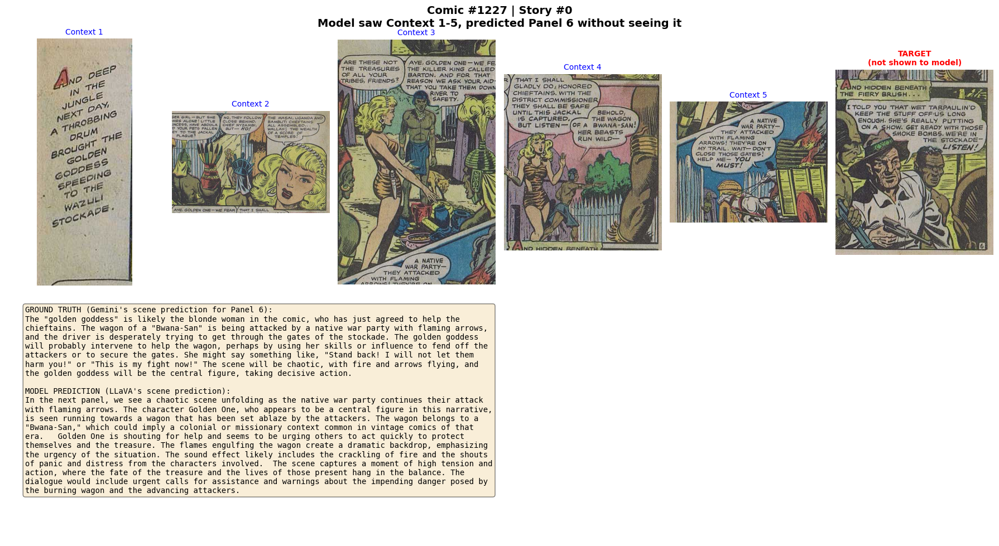

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 2
######################################################################


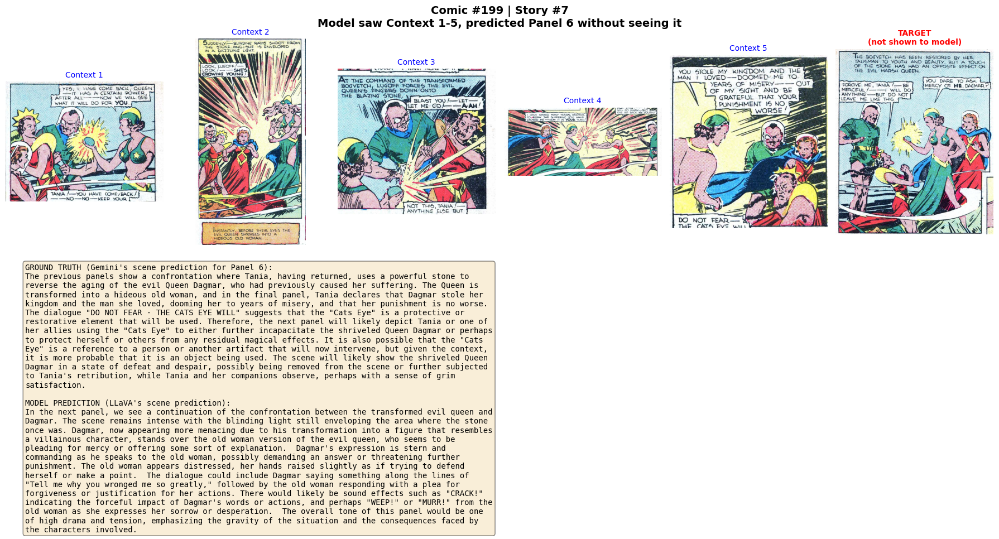

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 3
######################################################################


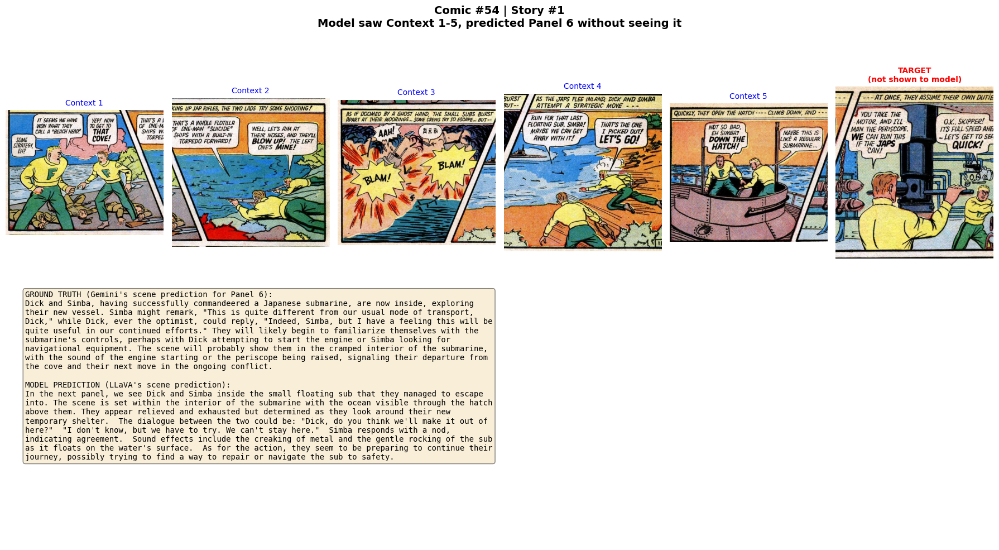

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 4
######################################################################


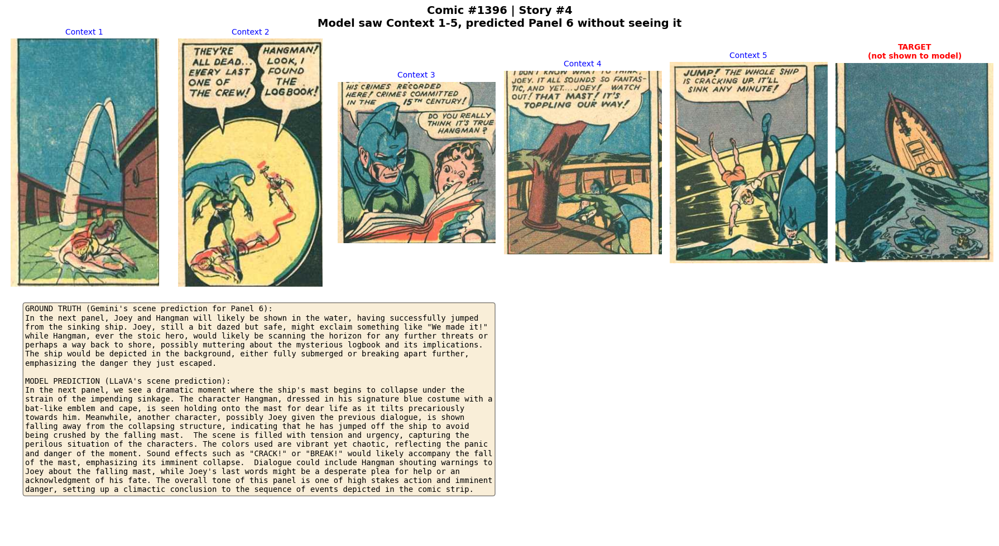

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 5
######################################################################


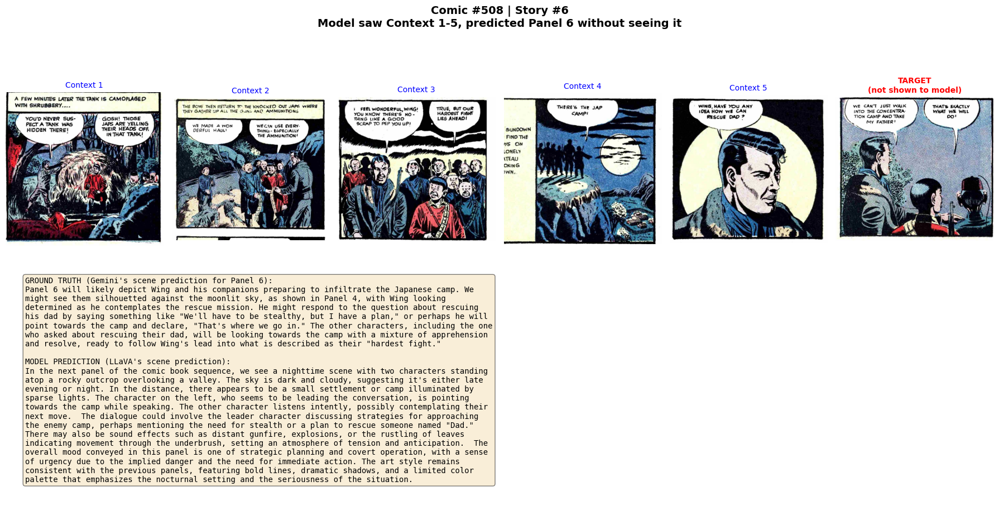

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 6
######################################################################


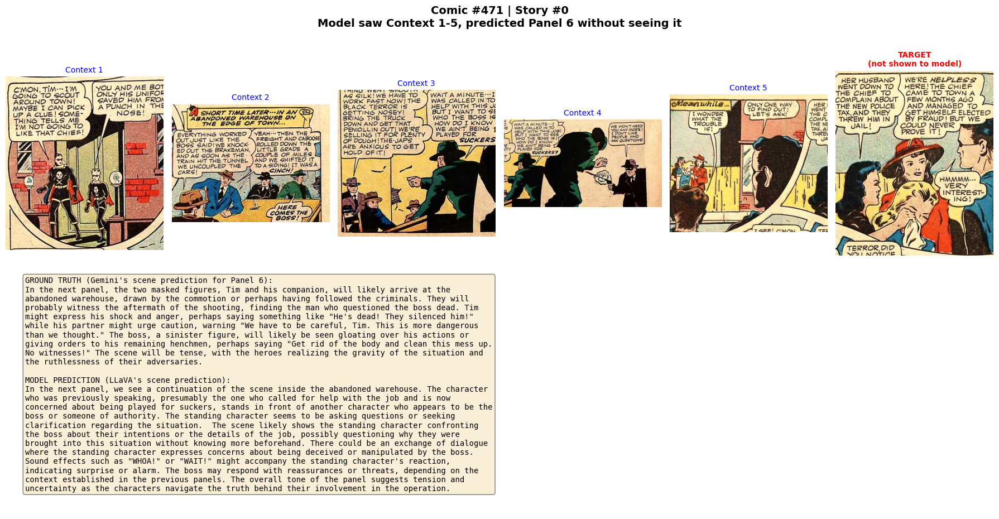

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 7
######################################################################


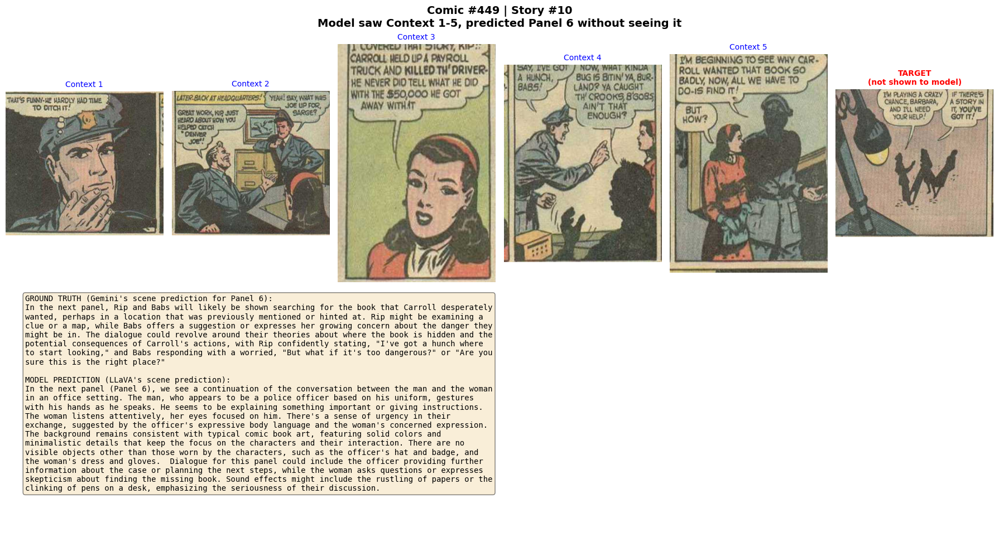

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 8
######################################################################


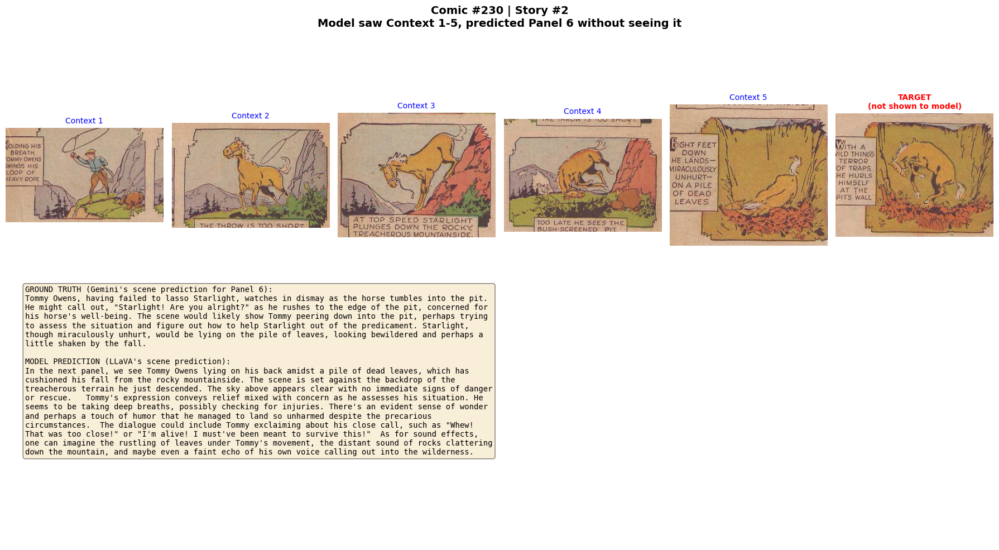

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 9
######################################################################


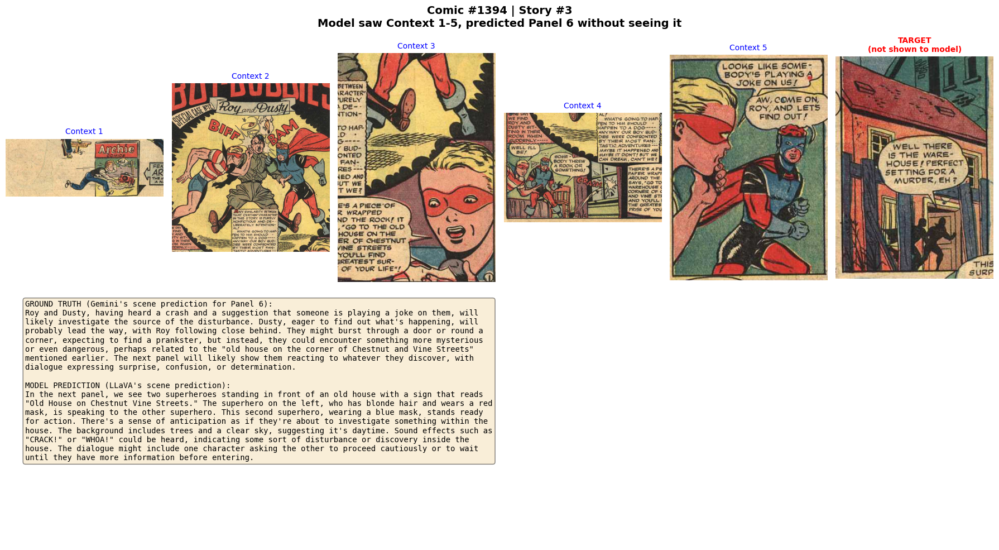

──────────────────────────────────────────────────────────────────────

######################################################################
# EXAMPLE 10
######################################################################


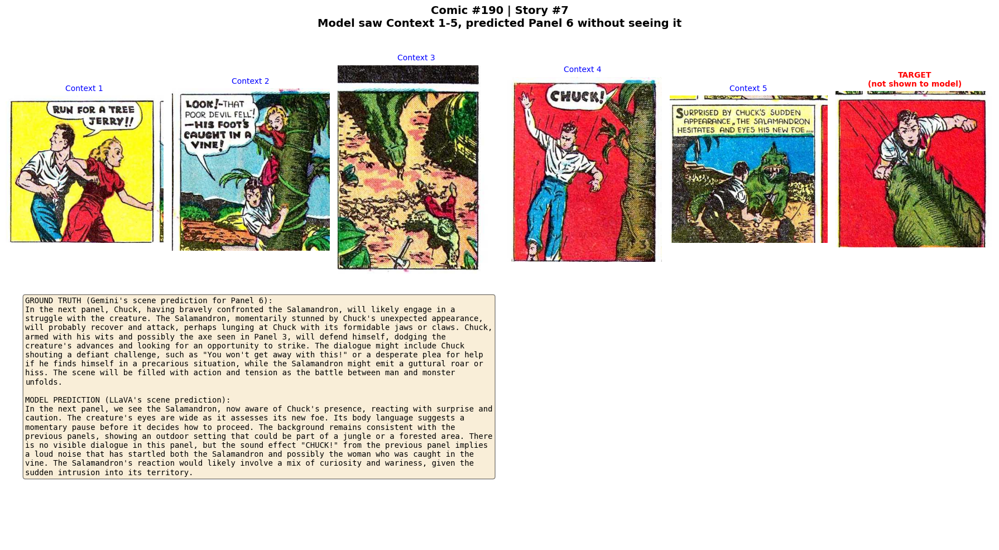

──────────────────────────────────────────────────────────────────────


In [7]:
# =============================================================================
# SHOW SAMPLE RESULTS
# =============================================================================

NUM_TO_SHOW = 10

print(f"Showing {NUM_TO_SHOW} examples:")
print("="*70)

successful = [r for r in results if r['status'] == 'success']

for i, result in enumerate(successful[:NUM_TO_SHOW]):
    print(f"\n{'#'*70}")
    print(f"# EXAMPLE {i+1}")
    print(f"{'#'*70}")
    visualize_result(result)

Example #20:


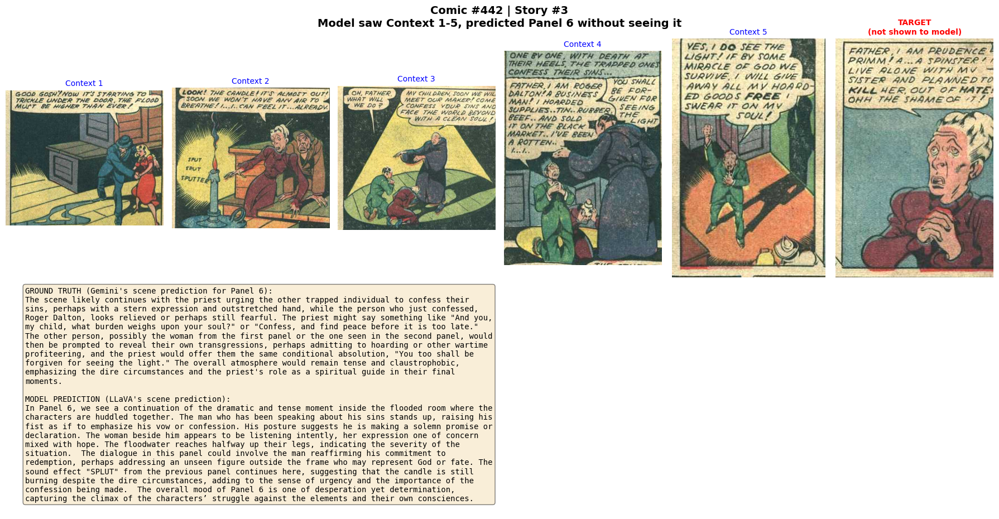

──────────────────────────────────────────────────────────────────────


In [10]:
# =============================================================================
# VIEW SPECIFIC EXAMPLE
# =============================================================================

EXAMPLE_NUMBER = 20  # Change this to view different examples (1 to 100)

for r in results:
    if r['id'] == EXAMPLE_NUMBER:
        print(f"Example #{EXAMPLE_NUMBER}:")
        visualize_result(r)
        break
else:
    print(f"Example {EXAMPLE_NUMBER} not found.")

In [11]:
# =============================================================================
# VIEW RAW MODEL OUTPUT (for debugging)
# =============================================================================

EXAMPLE_NUMBER = 1  # Change this

for r in results:
    if r['id'] == EXAMPLE_NUMBER:
        print(f"Example #{EXAMPLE_NUMBER} - Raw Model Output:")
        print("="*70)
        print(r.get('raw_output', '[No output]'))
        print("="*70)
        print(f"\nGround Truth: {r.get('ground_truth', '[Empty]')}")
        break

Example #1 - Raw Model Output:
In the next panel, we see a chaotic scene unfolding as the native war party continues their attack with flaming arrows. The character Golden One, who appears to be a central figure in this narrative, is seen running towards a wagon that has been set ablaze by the attackers. The wagon belongs to a "Bwana-San," which could imply a colonial or missionary context common in vintage comics of that era. 

Golden One is shouting for help and seems to be urging others to act quickly to protect themselves and the treasure. The flames engulfing the wagon create a dramatic backdrop, emphasizing the urgency of the situation. The sound effect likely includes the crackling of fire and the shouts of panic and distress from the characters involved.

The scene captures a moment of high tension and action, where the fate of the treasure and the lives of those present hang in the balance. The dialogue would include urgent calls for assistance and warnings about the impending

In [12]:
# =============================================================================
# SUMMARY STATISTICS
# =============================================================================

successful = [r for r in results if r['status'] == 'success']

# Count results with content
has_scene = sum(1 for r in successful if r.get('scene_prediction'))
has_gt = sum(1 for r in successful if r.get('ground_truth'))

# Average prediction length
scene_lengths = [len(r.get('scene_prediction', '')) for r in successful if r.get('scene_prediction')]
avg_length = sum(scene_lengths) / len(scene_lengths) if scene_lengths else 0

print("="*70)
print("SUMMARY STATISTICS")
print("="*70)
print(f"\nTotal examples: {len(results)}")
print(f"Successful: {len(successful)}")
print(f"\nScene descriptions generated: {has_scene}/{len(successful)} ({100*has_scene/len(successful):.1f}%)")
print(f"Ground truth available: {has_gt}/{len(successful)} ({100*has_gt/len(successful):.1f}%)")
print(f"\nAverage prediction length: {avg_length:.0f} characters")

# Show a few sample predictions
print("\n" + "="*70)
print("SAMPLE PREDICTIONS (text only)")
print("="*70)

for i, r in enumerate(successful[:3]):
    print(f"\n--- Example {r['id']} ---")
    print(f"Prediction: {r.get('scene_prediction', '[None]')[:300]}...")
    print(f"Ground Truth: {r.get('ground_truth', '[Empty]')[:200]}...")

SUMMARY STATISTICS

Total examples: 1000
Successful: 1000

Scene descriptions generated: 1000/1000 (100.0%)
Ground truth available: 1000/1000 (100.0%)

Average prediction length: 986 characters

SAMPLE PREDICTIONS (text only)

--- Example 1 ---
Prediction: In the next panel, we see a chaotic scene unfolding as the native war party continues their attack with flaming arrows. The character Golden One, who appears to be a central figure in this narrative, is seen running towards a wagon that has been set ablaze by the attackers. The wagon belongs to a "B...
Ground Truth: The "golden goddess" is likely the blonde woman in the comic, who has just agreed to help the chieftains. The wagon of a "Bwana-San" is being attacked by a native war party with flaming arrows, and th...

--- Example 2 ---
Prediction: In the next panel, we see a continuation of the confrontation between the transformed evil queen and Dagmar. The scene remains intense with the blinding light still enveloping the area where

In [ ]:
# =============================================================================
# CALCULATE METRICS: BLEU, ROUGE, and BERTScore
# =============================================================================

import pickle
from pathlib import Path

PROJECT_DIR = "/scratch/bftl/hsekar/comics_project"
RESULTS_FILE = Path(f"{PROJECT_DIR}/outputs/zero_shot_pred/results_latest.pkl")

# Load results
with open(RESULTS_FILE, 'rb') as f:
    data = pickle.load(f)

results = data['results']
successful = [r for r in results if r['status'] == 'success']

# Prepare predictions and ground truths
predictions = []
ground_truths = []

for r in successful:
    pred = r.get('scene_prediction', '') or r.get('predicted_text', '')
    gt = r.get('ground_truth', '')
    
    if pred and gt and len(pred.strip()) > 10 and len(gt.strip()) > 5:
        predictions.append(pred.strip())
        ground_truths.append(gt.strip())

print(f"Examples with both prediction and ground truth: {len(predictions)}")

# -----------------------------------------------------------------------------
# BLEU SCORE
# -----------------------------------------------------------------------------
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import nltk
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    nltk.download('punkt', quiet=True)

smoothing = SmoothingFunction().method1
bleu_scores = []

for pred, gt in zip(predictions, ground_truths):
    pred_tokens = pred.lower().split()
    gt_tokens = [gt.lower().split()]
    score = sentence_bleu(gt_tokens, pred_tokens, smoothing_function=smoothing)
    bleu_scores.append(score)

avg_bleu = sum(bleu_scores) / len(bleu_scores)
print(f"\n✅ BLEU Score: {avg_bleu:.4f}")

# -----------------------------------------------------------------------------
# ROUGE SCORE
# -----------------------------------------------------------------------------
from rouge_score import rouge_scorer

scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
rouge1_scores, rouge2_scores, rougeL_scores = [], [], []

for pred, gt in zip(predictions, ground_truths):
    scores = scorer.score(gt, pred)
    rouge1_scores.append(scores['rouge1'].fmeasure)
    rouge2_scores.append(scores['rouge2'].fmeasure)
    rougeL_scores.append(scores['rougeL'].fmeasure)

avg_rouge1 = sum(rouge1_scores) / len(rouge1_scores)
avg_rouge2 = sum(rouge2_scores) / len(rouge2_scores)
avg_rougeL = sum(rougeL_scores) / len(rougeL_scores)

print(f"✅ ROUGE-1: {avg_rouge1:.4f}")
print(f"✅ ROUGE-2: {avg_rouge2:.4f}")
print(f"✅ ROUGE-L: {avg_rougeL:.4f}")

# -----------------------------------------------------------------------------
# BERTSCORE
# -----------------------------------------------------------------------------
from bert_score import score as bert_score
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"\nCalculating BERTScore (device: {device})...")

P, R, F1 = bert_score(predictions, ground_truths, lang='en', device=device, verbose=False)

avg_bert_precision = P.mean().item()
avg_bert_recall = R.mean().item()
avg_bert_f1 = F1.mean().item()

print(f"✅ BERTScore Precision: {avg_bert_precision:.4f}")
print(f"✅ BERTScore Recall:    {avg_bert_recall:.4f}")
print(f"✅ BERTScore F1:        {avg_bert_f1:.4f}")

# -----------------------------------------------------------------------------
# SUMMARY
# -----------------------------------------------------------------------------
print("\n" + "="*50)
print("ZERO-SHOT BASELINE (PRED) METRICS SUMMARY")
print("="*50)
print(f"  Examples:        {len(predictions)}")
print(f"  BLEU:            {avg_bleu:.4f}")
print(f"  ROUGE-1:         {avg_rouge1:.4f}")
print(f"  ROUGE-2:         {avg_rouge2:.4f}")
print(f"  ROUGE-L:         {avg_rougeL:.4f}")
print(f"  BERTScore F1:    {avg_bert_f1:.4f}")
print("="*50)

# Save metrics to results
data['metadata']['bleu'] = avg_bleu
data['metadata']['rouge1'] = avg_rouge1
data['metadata']['rouge2'] = avg_rouge2
data['metadata']['rougeL'] = avg_rougeL
data['metadata']['bertscore_f1'] = avg_bert_f1

with open(RESULTS_FILE, 'wb') as f:
    pickle.dump(data, f)
print("\n✅ Metrics saved to results file!")

Examples with both prediction and ground truth: 1000

✅ BLEU Score: 0.0219
✅ ROUGE-1: 0.3487
✅ ROUGE-2: 0.0707
✅ ROUGE-L: 0.1785


/u/hsekar/comics_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Calculating BERTScore (device: cpu)...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ BERTScore Precision: 0.8497
✅ BERTScore Recall:    0.8575
✅ BERTScore F1:        0.8535

ZERO-SHOT BASELINE (PRED) METRICS SUMMARY
  Examples:        1000
  BLEU:            0.0219
  ROUGE-1:         0.3487
  ROUGE-2:         0.0707
  ROUGE-L:         0.1785
  BERTScore F1:    0.8535

✅ Metrics saved to results file!


: 

In [6]:
import pickle
from pathlib import Path

# Load the data
data_path = Path("/scratch/bftl/hsekar/comics_project/data/processed/test_sequences_with_predictions.pkl")
with open(data_path, "rb") as f:
    sequences = pickle.load(f)

# Check the first sequence's keys
print("Available fields in sequence:")
print(sequences[0].keys())

# Check what's in each relevant field
seq = sequences[0]
print("\n--- scene_prediction ---")
print(seq.get("scene_prediction", "NOT FOUND")[:500] if seq.get("scene_prediction") else "NOT FOUND")

print("\n--- scene_description ---")
print(seq.get("scene_description", "NOT FOUND")[:500] if seq.get("scene_description") else "NOT FOUND")

print("\n--- target panel text ---")
print(seq.get("target", {}).get("text", "NOT FOUND")[:500] if seq.get("target", {}).get("text") else "NOT FOUND")

Available fields in sequence:
dict_keys(['comic_no', 'story_idx', 'context', 'target', 'target_text', 'context_texts', 'scene_prediction'])

--- scene_prediction ---
Panel 6 will likely depict Dave Kenton, the Star Patrolman, reacting to the news of the Coalsack Pirates' latest heist. He might be shown in his patrol office on Flayal, looking grim as he holds the report detailing the stolen gold and platinum. A fellow officer or superior might be present, perhaps saying something like, "This is the third raid this month, Kenton! We have to stop them!" Kenton, determined, could then declare, "We will. I'm going after them." The panel might also show a glimpse 

--- scene_description ---
NOT FOUND

--- target panel text ---
JUST GOT MY ORDERS, SWEETHEART! I'M ROCKET- TING UP TONIGHT! SEALED ORDERS-TO GET THOSE PIRATES! ONE MAN- AGAINST A FLEET OF SPACE ROVERS?


In [7]:
import pickle
from pathlib import Path

# Load results
RESULTS_FILE = Path("/scratch/bftl/hsekar/comics_project/outputs/zero_shot_pred/results_latest.pkl")
with open(RESULTS_FILE, 'rb') as f:
    data = pickle.load(f)

# Check what's in ground_truth
results = data['results']
successful = [r for r in results if r.get('status') == 'success']

print("First result ground_truth sample:")
print(successful[0].get('ground_truth', 'NOT FOUND')[:200])
print("\nFirst result scene_prediction sample:")
print(successful[0].get('scene_prediction', 'NOT FOUND')[:200])

# Check all keys
print("\nAll keys in result:")
print(successful[0].keys())

First result ground_truth sample:
The "golden goddess" is likely the blonde woman in the comic, who has just agreed to help the chieftains. The wagon of a "Bwana-San" is being attacked by a native war party with flaming arrows, and th

First result scene_prediction sample:
In the next panel, we see a chaotic scene unfolding as the native war party continues their attack with flaming arrows. The character Golden One, who appears to be a central figure in this narrative, 

All keys in result:
dict_keys(['id', 'comic_no', 'story_idx', 'context_image_paths', 'context_texts', 'target_image_path', 'target_page_no', 'target_panel_no', 'ground_truth', 'scene_prediction', 'predicted_text', 'raw_output', 'inference_time', 'status'])


---
# Summary
---

## What We Did

1. Created inference script with **simple prompt** (no complex structured output)
2. Ran evaluation on GPU via SLURM
3. Model outputs **free-form scene descriptions** - used as-is

## Output Files

```
/scratch/bftl/hsekar/comics_project/outputs/zero_shot_baseline/
├── results_latest.pkl     ← For visualization
├── results_TIMESTAMP.pkl  ← Backup
└── results_TIMESTAMP.json ← Human-readable
```

## For Your Report

The zero-shot baseline shows:
- Model understands comic narrative context
- Generates coherent scene descriptions
- Can be used as input for Stable Diffusion

## Next Step

**Fine-tuning the model** to generate more accurate predictions!